# domain shift

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from plantclef.spark import get_spark

spark = get_spark()
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/02/27 00:20:36 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/02/27 00:20:36 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).
25/02/27 00:20:36 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


In [3]:
import os
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path(os.path.expanduser("~"))
! date

Thu Feb 27 12:20:38 AM EST 2025


In [4]:
# Path and dataset names
project_data_path = f"{root}/p-dsgt_clef2025-0/shared/plantclef/data"

# Define the path to the train and test parquet files
test_path = f"{project_data_path}/parquet/test_2024"

# Read the parquet files into a spark DataFrame
test_df = spark.read.parquet(test_path)

# Show the data
test_df.printSchema()
test_df.show(n=5)

root
 |-- image_name: string (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)



+--------------------+--------------------+--------------------+
|          image_name|                path|                data|
+--------------------+--------------------+--------------------+
|CBN-PdlC-C6-20130...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-Pla-D3-201508...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C3-20190...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-C1-20200...|/test_2024/images...|[FF D8 FF E0 00 1...|
|CBN-PdlC-B2-20160...|/test_2024/images...|[FF D8 FF E0 00 1...|
+--------------------+--------------------+--------------------+
only showing top 5 rows



In [5]:
# interesting test images
images = [
    "CBN-Pyr-03-20230706.jpg",
    "OPTMix-012-P2-207-20231201.jpg",
    "OPTMix-0178-P1-661-20231006.jpg",
    "OPTMix-0333-P2-115-20231212.jpg",
    "OPTMix-0598-P4-104-20231207.jpg",
    "RNNB-1-4-20240117.jpg",
    "RNNB-1-7-20230512.jpg",
    "RNNB-1-8-20230512.jpg",
    "RNNB-4-2-20240118.jpg",
    "RNNB-8-8-20240118.jpg",
    "CBN-can-E6-20230706.jpg",
    "CBN-Pla-A3-20140812.jpg",
]

In [6]:
from pyspark.sql import functions as F

# get subset of images
subset_df = test_df.where(F.col("image_name").isin(images)).cache()
subset_df.show(n=12)

+--------------------+--------------------+--------------------+
|          image_name|                path|                data|
+--------------------+--------------------+--------------------+
|OPTMix-0598-P4-10...|/test_2024/images...|[FF D8 FF DB 00 4...|
|OPTMix-0333-P2-11...|/test_2024/images...|[FF D8 FF DB 00 4...|
|CBN-can-E6-202307...|/test_2024/images...|[FF D8 FF DB 00 4...|
|RNNB-1-7-20230512...|/test_2024/images...|[FF D8 FF DB 00 4...|
|RNNB-8-8-20240118...|/test_2024/images...|[FF D8 FF DB 00 4...|
|OPTMix-012-P2-207...|/test_2024/images...|[FF D8 FF DB 00 4...|
|CBN-Pyr-03-202307...|/test_2024/images...|[FF D8 FF DB 00 4...|
|RNNB-1-4-20240117...|/test_2024/images...|[FF D8 FF DB 00 4...|
|RNNB-4-2-20240118...|/test_2024/images...|[FF D8 FF DB 00 4...|
|CBN-Pla-A3-201408...|/test_2024/images...|[FF D8 FF E0 00 1...|
|RNNB-1-8-20230512...|/test_2024/images...|[FF D8 FF DB 00 4...|
|OPTMix-0178-P1-66...|/test_2024/images...|[FF D8 FF DB 00 4...|
+--------------------+---

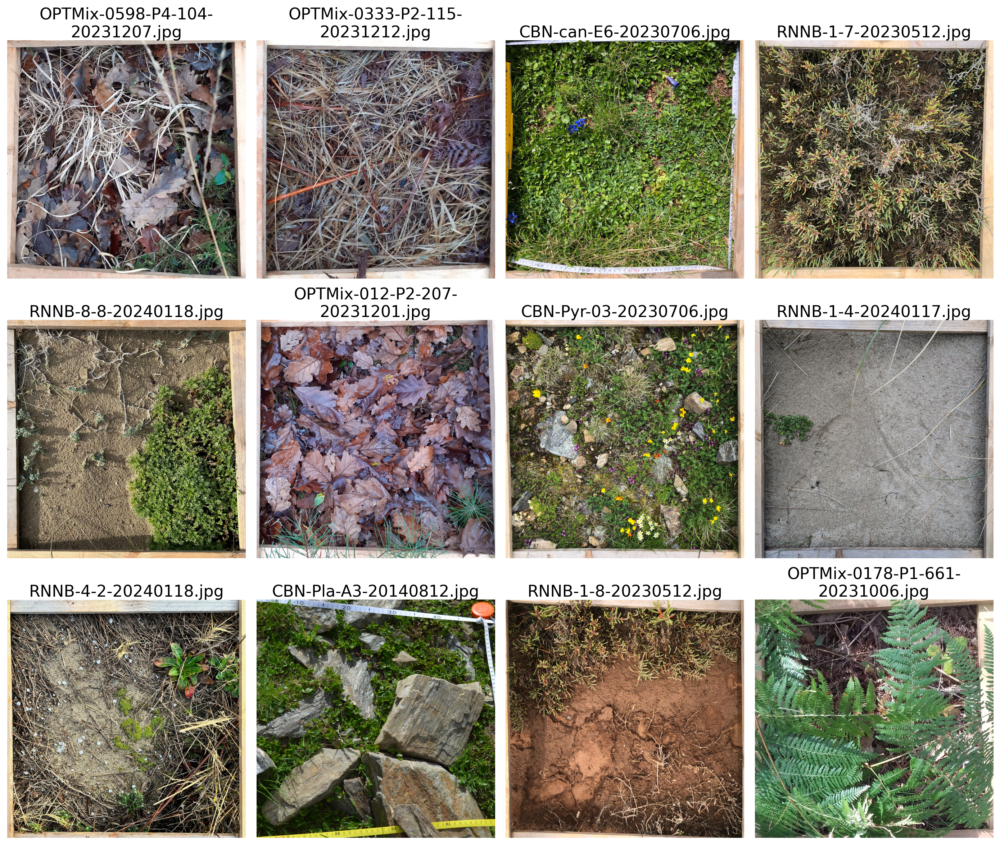

In [41]:
from plantclef.plotting import plot_images_from_binary

# Display the images in a grid with binomial names
plot_images_from_binary(
    subset_df,
    data_col="data",
    image_col="image_name",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=200,
)